In [45]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing

In [51]:
players_data = pd.read_csv ("./data/all_seasons.csv")
#Remove undrafted
players_data = players_data.drop(players_data[players_data.draft_round == 'Undrafted'].index)
players_data['draft_round'] = pd.to_numeric(players_data['draft_round'])
#nr = net rating
eda = players_data[["net_rating", "age", "player_height", "player_weight", "pts", "reb", "ast","oreb_pct","dreb_pct","usg_pct","ts_pct","ast_pct"]]

In [52]:
#Standardize
eda = preprocessing.StandardScaler().fit_transform(eda)

#Transform
eda = pd.DataFrame(eda)
eda.columns = ["net_rating", "age", "player_height", "player_weight", "pts", "reb", "ast","oreb_pct","dreb_pct","usg_pct","ts_pct","ast_pct"]
eda_log = pd.DataFrame(np.log(eda))
eda_log.columns = ["net_rating", "age", "player_height", "player_weight", "pts", "reb", "ast","oreb_pct","dreb_pct","usg_pct","ts_pct","ast_pct"]
eda_sqrt = pd.DataFrame(np.sqrt(eda))
eda_sqrt.columns = ["net_rating", "age", "player_height", "player_weight", "pts", "reb", "ast","oreb_pct","dreb_pct","usg_pct","ts_pct","ast_pct"]
eda_cuberoot = pd.DataFrame(np.power(eda, 1/3))
eda_cuberoot.columns = ["net_rating", "age", "player_height", "player_weight", "pts", "reb", "ast","oreb_pct","dreb_pct","usg_pct","ts_pct","ast_pct"]

c:\Users\Jeff\AppData\Local\Programs\Python\Python39\lib\site-packages\pandas\core\internals\blocks.py:351: RuntimeWarning: invalid value encountered in log
  result = func(self.values, **kwargs)
c:\Users\Jeff\AppData\Local\Programs\Python\Python39\lib\site-packages\pandas\core\internals\blocks.py:351: RuntimeWarning: invalid value encountered in sqrt
  result = func(self.values, **kwargs)


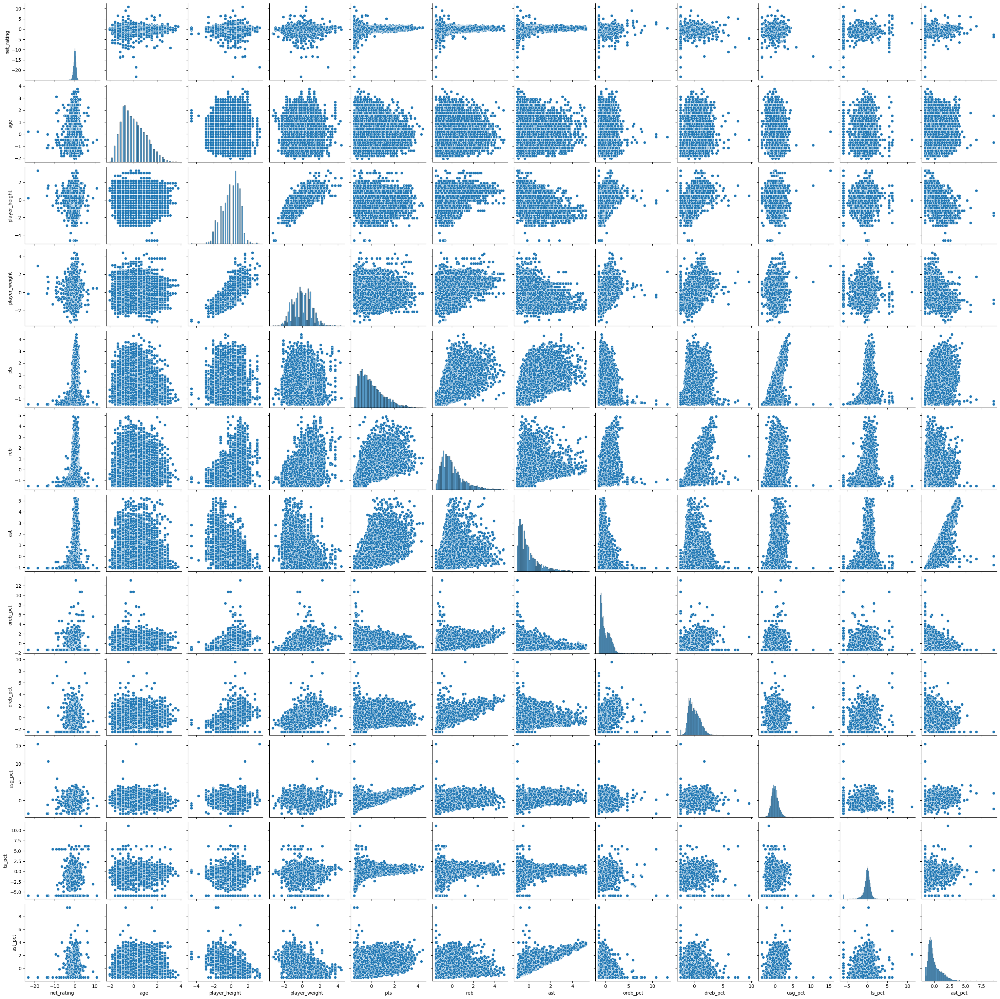

In [53]:
sns.pairplot(eda)

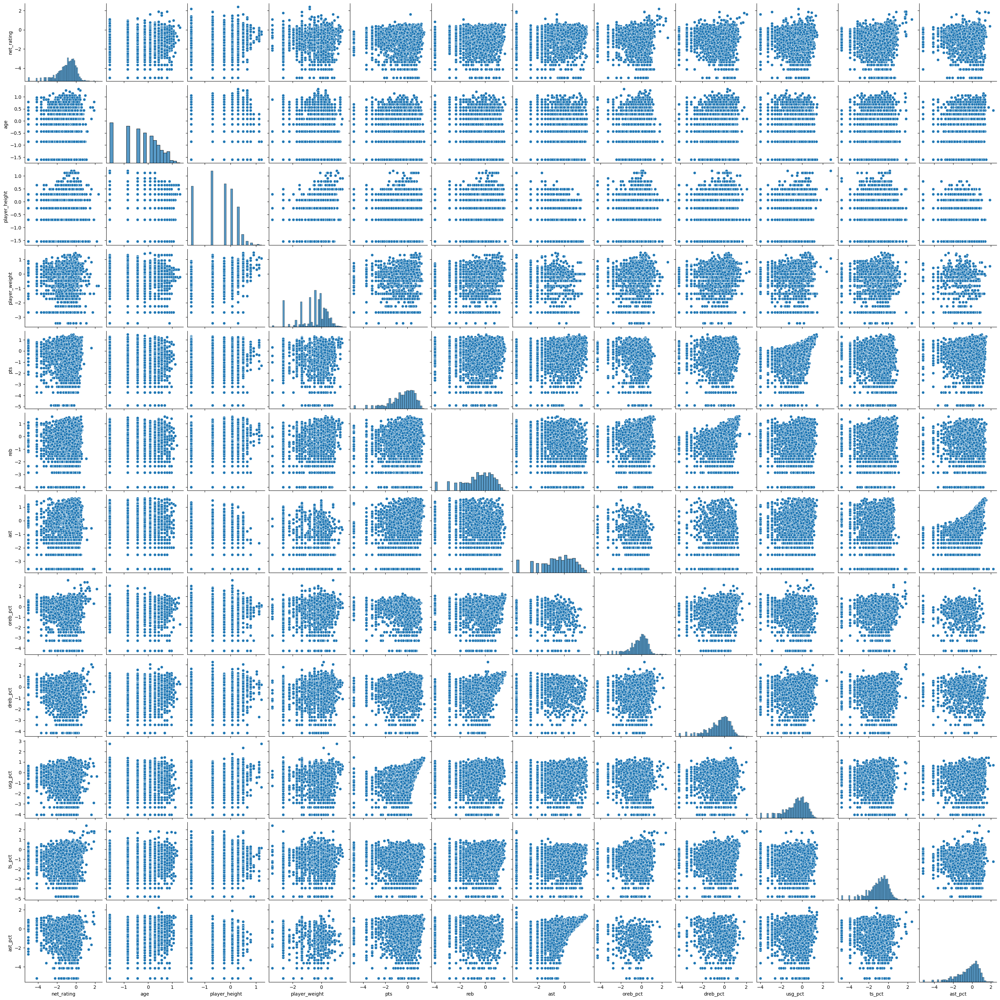

In [54]:
sns.pairplot(eda_log)

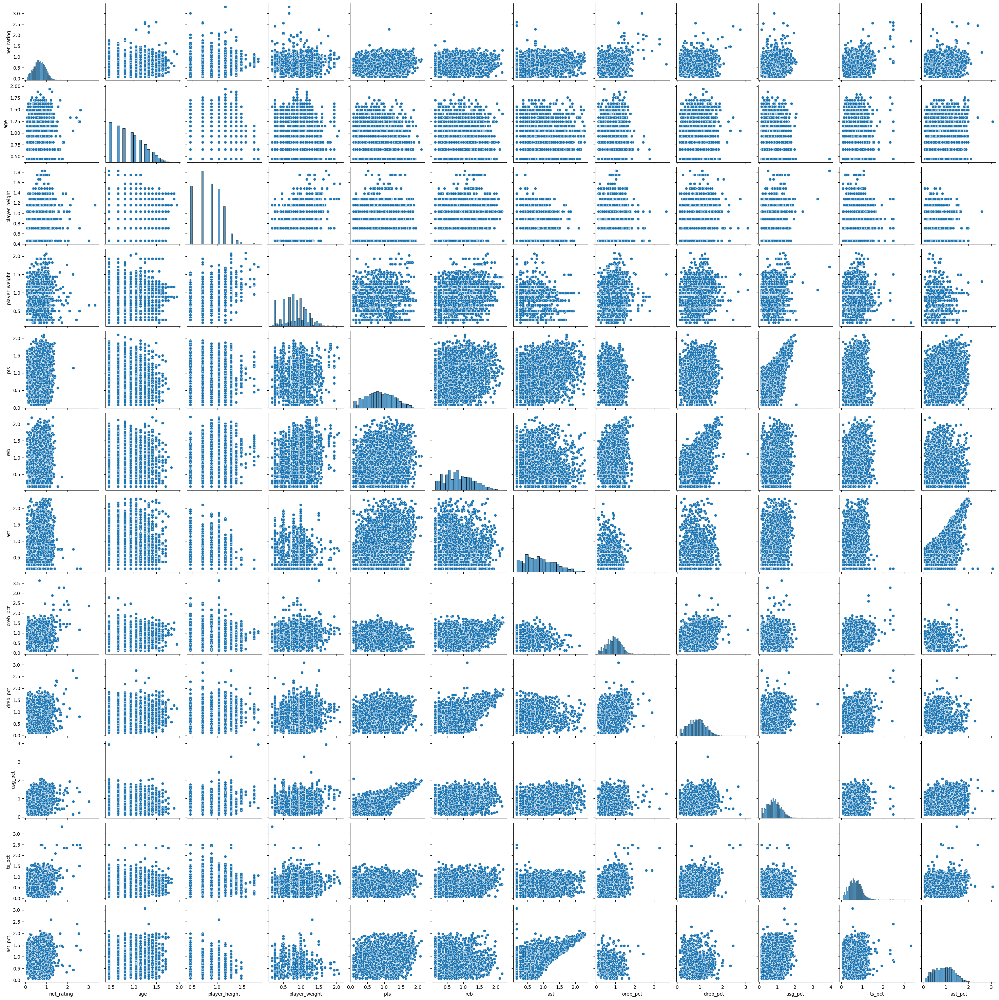

In [55]:
sns.pairplot(eda_sqrt)

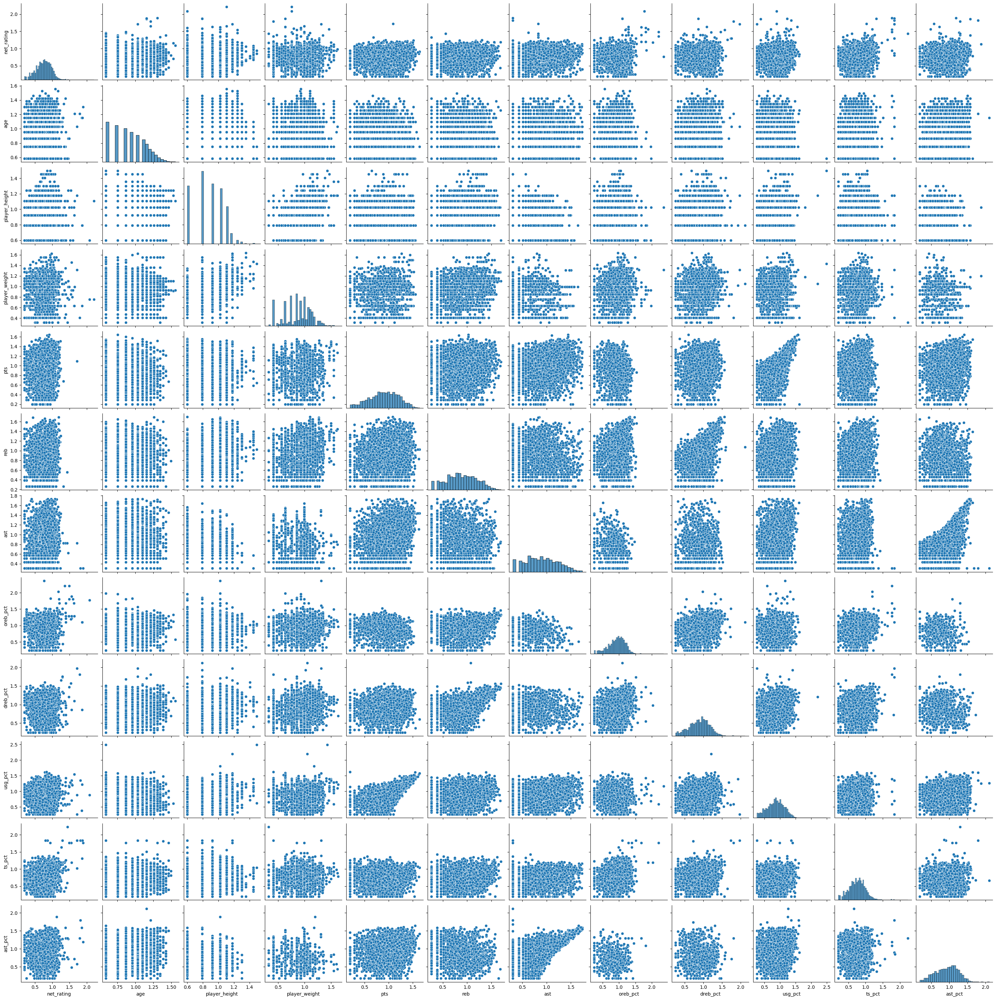

In [56]:
sns.pairplot(eda_cuberoot)

In [61]:
#net_rating transformations
nr = pd.DataFrame()
nr['net_rating'] = eda['net_rating']
nr['net_rating_log'] = eda_log['net_rating']
nr['net_rating_squareroot'] = eda_sqrt['net_rating']
nr['net_rating_cuberoot'] = eda_cuberoot['net_rating']

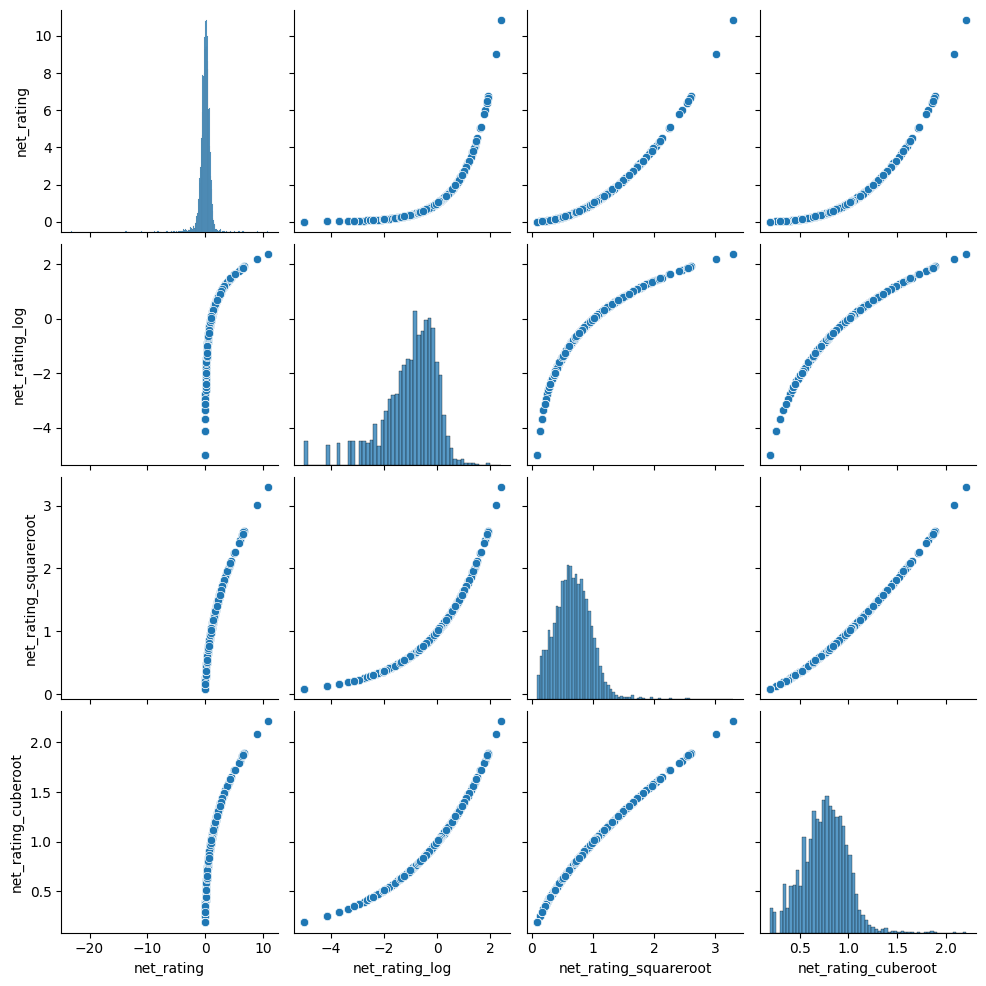

In [62]:
sns.pairplot(nr)

In [66]:
#add draft round
eda_log['draft_round'] = players_data['draft_round']
eda['draft_round'] = players_data['draft_round']
#nr['net_rating'] = eda['net_rating']
#nr['net_rating_log'] = eda_log['net_rating']
#nr['net_rating_squareroot'] = eda_sqrt['net_rating']
#nr['net_rating_cuberoot'] = eda_cuberoot['net_rating']

<AxesSubplot: >

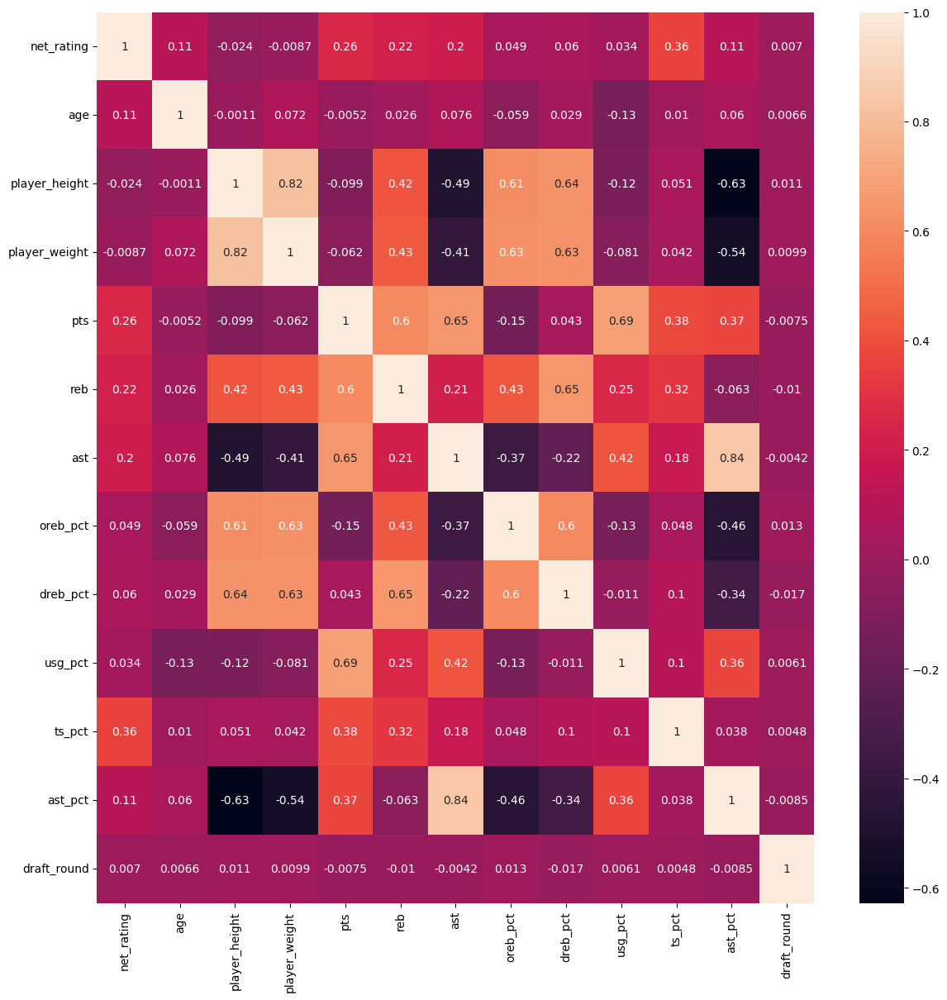

In [67]:
fig, ax = plt.subplots(figsize=(14, 14))
sns.heatmap(eda.corr(), annot=True)

<AxesSubplot: >

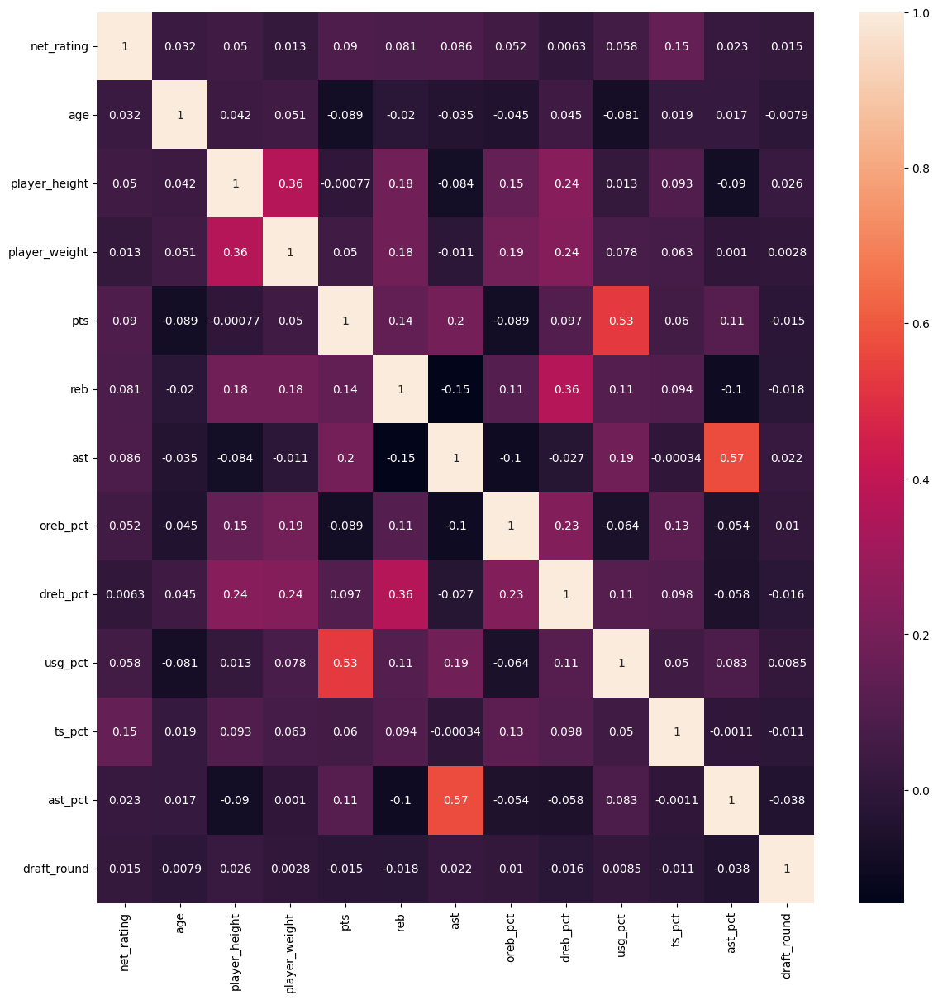

In [65]:
fig, ax = plt.subplots(figsize=(14, 14))
sns.heatmap(eda_log.corr(), annot=True)

<AxesSubplot: >

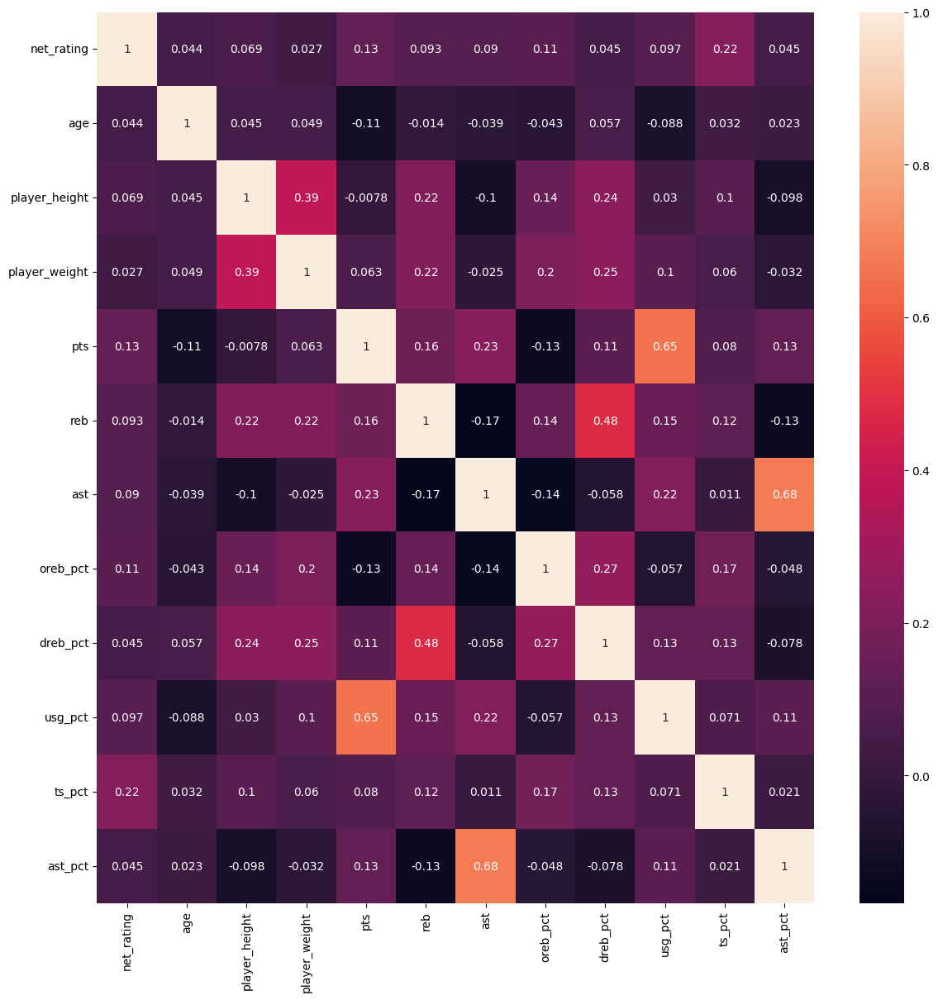

In [59]:
fig, ax = plt.subplots(figsize=(14, 14))
sns.heatmap(eda_cuberoot.corr(), annot=True)